In [1]:
import os, sys
module_path = os.path.abspath(os.path.join('../..'))
if module_path not in sys.path:
    sys.path.append(module_path)
import MaaSSim

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
#!pip install MaaSSim
import MaaSSim.utils
import logging
from dotmap import DotMap
import MaaSSim.simulators
from MaaSSim.data_structures import structures as inData
from MaaSSim.day_to_day import S_driver_opt_out, S_traveller_opt_out
from MaaSSim.day_to_day import d2d_kpi_veh, d2d_kpi_pax

In [4]:
import osmnx as ox
import networkx as nx
import random
import math
import pandas as pd
import matplotlib.pyplot as plt          
import numpy as np
import seaborn as sns
from statsmodels.tsa.stattools import adfuller

In [6]:
# the setting for TRB results do not delete
params = MaaSSim.utils.get_config('glance.json')
params.city = "Amsterdam, Netherlands"
params.paths.G = "../../data/graphs/Amsterdam.graphml"
params.paths.skim = "../../data/graphs/Amsterdam.csv"
params.vehicle_fixed_positions = True
params.times.patience = 600 #second
params.dist_threshold = 20000 #meter
params.dist_threshold_min = 3000 #meter

params.d2d.probabilistic = True
params.d2d.heterogeneous = False
params.d2d.B_income = 1
params.d2d.fuel_cost = 0.25 #euro/km

params.d2d.B_inveh_time = 1
params.d2d.B_exp_time = 2 #1.5 in oded's paper
params.PT_fare = 1 ## euro
params.PT_avg_speed = 6

params.nPM = 2 # number of platforms. platform id starts from 1
params.platforms.base_fare = 1.4 #euro
params.platforms.fare = float(1.20) #euro/km
params.platforms.min_fare = float(2) # euro
params.platforms.comm_rate = float(0.10)
params.platforms.discount = float(0.0)
params.platforms.daily_marketing = False

params.d2d.learning_d = 1 
params.d2d.B_Experience = 0.70
params.d2d.B_WOM = 0.20
params.d2d.B_Marketing = 0.10
params.d2d.diffusion_speed = 10/100 # speed for M is twice greater than WOM.
params.d2d.m = 5
params.d2d.mn = 5 # for NL
params.d2d.ini_att = 0.01
params.d2d.Eini_att = 0.01
params.d2d.adj_s = 2
params.VoT = 10.63 # value of time per hour
params.assert_me = False
params.seed = 1
params.paths.requests = 'Amsterdam_requests.csv'

params.nP = 2000
params.nV = 200
params.nD = 365
params.simTime = 4
params.d2d.res_wage = params.simTime*10.63 #euro

In [8]:
# params.d2d.m = params.d2d.mn means no nest no correlation between platforms. 
# As we increase params.d2d.mn, correlation increase and the same utility difference between
# platforms results in higher probability difference
# That is why when params.d2d.mn = 5, both platforms stablize on the same market share but when
# params.d2d.mn = 10 they stablize on different market shares. And PT market share is higher.

# Indeed, the smaller theta leads to deterministic model.

In [ ]:
# we were expecting for a newcomer to be easier to gain market share. however, at presence of another
# platform it is even more difficult for the newcomer to launch. However, with theta m increase the
# share the w has more effect on the probability of newcomer but inside the nest becomes more 
# deterministic and newcomer gets less probability.
# Maybe we can increase the adaptation (learning) speed for the newcomer. eventhogh it wont really 
# change the gained market share

In [7]:
sim = MaaSSim.simulators.simulate(params=params, f_driver_out=S_driver_opt_out,f_trav_out=S_traveller_opt_out,
                                  kpi_veh=d2d_kpi_veh,kpi_pax=d2d_kpi_pax, logger_level=logging.WARNING)

This simulation uses albatros data
19-02-23 20:34:30-WARNING-Setting up 4h simulation at 2023-02-19 18:34:02 for 200 vehicles and 2000 passengers in Amsterdam, Netherlands
Day =  0
19-02-23 20:34:37-WARNING-simulation time 2.7 s
np1 =  0   np2 =  0
Day =  1
19-02-23 20:34:45-WARNING-simulation time 3.0 s
np1 =  22   np2 =  0
Day =  2
19-02-23 20:34:54-WARNING-simulation time 3.0 s
np1 =  31   np2 =  0
Day =  3
19-02-23 20:35:03-WARNING-simulation time 3.9 s
np1 =  60   np2 =  0
Day =  4
19-02-23 20:35:14-WARNING-simulation time 4.6 s
np1 =  85   np2 =  0
Day =  5
19-02-23 20:35:24-WARNING-simulation time 4.8 s
np1 =  104   np2 =  0
Day =  6
19-02-23 20:35:34-WARNING-simulation time 5.0 s
np1 =  113   np2 =  0
Day =  7
19-02-23 20:35:46-WARNING-simulation time 5.8 s
np1 =  119   np2 =  0
Day =  8
19-02-23 20:35:57-WARNING-simulation time 5.6 s
np1 =  143   np2 =  0
Day =  9
19-02-23 20:36:08-WARNING-simulation time 5.3 s
np1 =  129   np2 =  0
Day =  10
19-02-23 20:36:18-WARNING-simulati

In [72]:
d = pd.read_csv('duo_baseline_R1.csv')
d.V_P1_SHARE

0      0.000
1      0.010
2      0.015
3      0.020
4      0.035
       ...  
360    0.370
361    0.360
362    0.360
363    0.325
364    0.370
Name: V_P1_SHARE, Length: 365, dtype: float64

In [73]:
d.V_P2_SHARE

0      0.000
1      0.010
2      0.010
3      0.035
4      0.025
       ...  
360    0.355
361    0.380
362    0.360
363    0.430
364    0.370
Name: V_P2_SHARE, Length: 365, dtype: float64

In [ ]:
df

In [94]:
fd = pd.DataFrame()
fd['th_ratio'] = [1, 0.8, 0.6, 0.4, 0.2, 0.0]
# df['m_share_PT'] = []
fd['m_share_P1'] = [0.370, 0.350, 0.330, 0.280, 0.250, 0.285]
fd['m_share_P2'] = [0.370, 0.370, 0.325, 0.340, 0.310, 0.275]
fd['m_share_RH'] = fd['m_share_P1'] + fd['m_share_P2']
fd['m_share_PT'] = 1-fd['m_share_RH']
fd

,th_ratio,m_share_P1,m_share_P2,m_share_RH,m_share_PT
0,1.0,0.370,0.370,0.740,0.260
1,0.8,0.350,0.370,0.720,0.280
2,0.6,0.330,0.325,0.655,0.345
3,0.4,0.280,0.340,0.620,0.380
4,0.2,0.250,0.310,0.560,0.440
5,0.0,0.285,0.275,0.560,0.440


In [95]:
df = pd.DataFrame()
df['th_ratio'] = [1, 0.8, 0.6, 0.4, 0.2, 0.0]
# df['m_share_PT'] = []
df['m_share_P1'] = [0.3260, 0.2990, 0.2845, 0.2335, 0.1970, 0.2650]
df['m_share_P2'] = [0.3060,0.2895, 0.2590, 0.2850, 0.3055, 0.2380]
df['m_share_RH'] = df['m_share_P1'] + df['m_share_P2']
df['m_share_PT'] = 1-df['m_share_RH']
df

,th_ratio,m_share_P1,m_share_P2,m_share_RH,m_share_PT
0,1.0,0.3260,0.3060,0.6320,0.3680
1,0.8,0.2990,0.2895,0.5885,0.4115
2,0.6,0.2845,0.2590,0.5435,0.4565
3,0.4,0.2335,0.2850,0.5185,0.4815
4,0.2,0.1970,0.3055,0.5025,0.4975
5,0.0,0.2650,0.2380,0.5030,0.4970


<AxesSubplot:xlabel='th_ratio', ylabel='m_share_PT'>

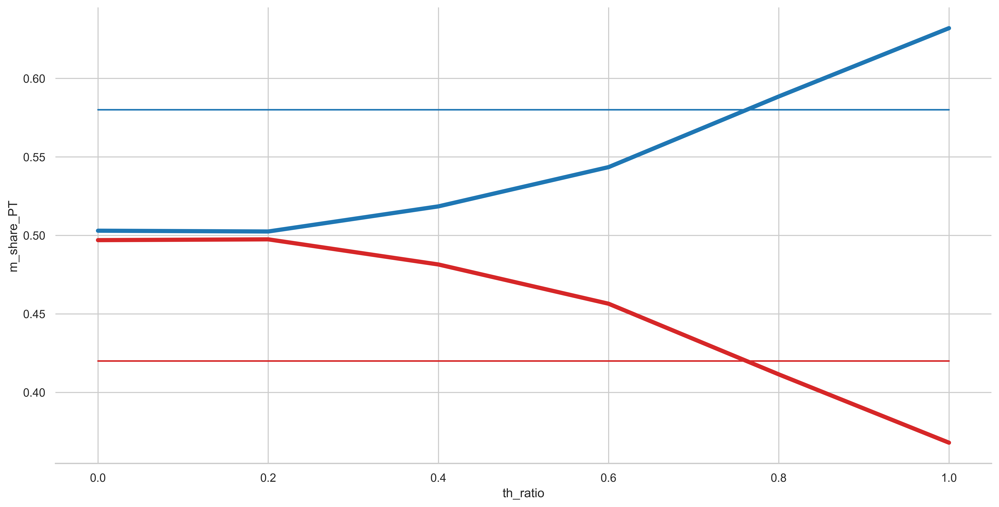

In [79]:
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(figsize=(16,8))
sns.despine(left=True)

sns.lineplot(x= df['th_ratio'], y=df['m_share_RH'], color='C0', lw=4)
sns.lineplot(x= df['th_ratio'], y=df['m_share_PT'], color='C3', lw=4)
sns.lineplot(x= [0,1], y=[0.58,0.58], color='C0', markers='-')
sns.lineplot(x= [0,1], y=[0.42,0.42], color='C3', markers='-')

<AxesSubplot:xlabel='th_ratio', ylabel='m_share_PT'>

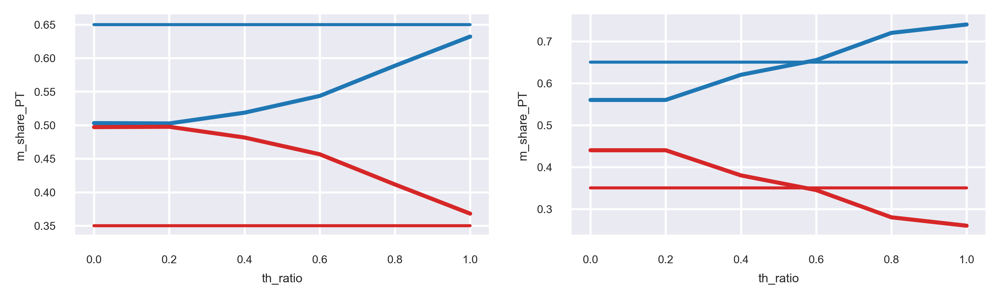

In [97]:
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=0.5)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('darkgrid')
fig, ax = plt.subplots(ncols=2, figsize=(8,2))
sns.despine(left=True)

sns.lineplot(x= df['th_ratio'], y=df['m_share_RH'], color='C0', lw=2, ax=ax[0])
sns.lineplot(x= df['th_ratio'], y=df['m_share_PT'], color='C3', lw=2, ax=ax[0])
sns.lineplot(x= [0,1], y=[0.65,0.65], color='C0', markers='o', ax=ax[0])
sns.lineplot(x= [0,1], y=[0.35,0.35], color='C3', markers='o', ax=ax[0])

sns.lineplot(x= fd['th_ratio'], y=fd['m_share_RH'], color='C0', lw=2, ax=ax[1])
sns.lineplot(x= fd['th_ratio'], y=fd['m_share_PT'], color='C3', lw=2, ax=ax[1])
sns.lineplot(x= [0,1], y=[0.65,0.65], color='C0', markers='o', ax=ax[1])
sns.lineplot(x= [0,1], y=[0.35,0.35], color='C3', markers='o', ax=ax[1])


In [10]:
DF = pd.DataFrame()

ye1 = []; ym1 = []; yw1 = []; yms1 = []
ye2 = []; ym2 = []; yw2 = []; yms2 = []

for d in range(0,sim.params.nD):
    df = sim.res[d].pax_exp
    yw1.append(df.P1_WOM_U.mean())
    ym1.append(df.P1_MARKETING_U.mean())
    ye1.append(df.P1_EXPERIENCE_U.mean())
    yms1.append(len(df[df.platform_id==1])/params.nP)
    
    yw2.append(df.P2_WOM_U.mean())
    ym2.append(df.P2_MARKETING_U.mean())
    ye2.append(df.P2_EXPERIENCE_U.mean())
    yms2.append(len(df[df.platform_id==2])/params.nP)

DF['P_P1_WOM_U'] = yw1
DF['P_P1_MARKETING_U'] = ym1
DF['P_P1_EXPERIENCE_U'] = ye1
DF['P_P1_SHARE'] = yms1

DF['P_P2_WOM_U'] = yw2
DF['P_P2_MARKETING_U'] = ym2
DF['P_P2_EXPERIENCE_U'] = ye2
DF['P_P2_SHARE'] = yms2    



ye1 = []; ym1 = []; yw1 = []; yms1 = []
ye2 = []; ym2 = []; yw2 = []; yms2 = []

for d in range(0,sim.params.nD):
    df = sim.res[d].veh_exp
    yw1.append(df.P1_WOM_U.mean())
    ym1.append(df.P1_MARKETING_U.mean())
    ye1.append(df.P1_EXPERIENCE_U.mean())
    yms1.append(len(df[df.platform_id==1])/params.nV)
    
    yw2.append(df.P2_WOM_U.mean())
    ym2.append(df.P2_MARKETING_U.mean())
    ye2.append(df.P2_EXPERIENCE_U.mean())
    yms2.append(len(df[df.platform_id==2])/params.nV)


DF['V_P1_WOM_U'] = yw1
DF['V_P1_MARKETING_U'] = ym1
DF['V_P1_EXPERIENCE_U'] = ye1
DF['V_P1_SHARE'] = yms1

DF['V_P2_WOM_U'] = yw2
DF['V_P2_MARKETING_U'] = ym2
DF['V_P2_EXPERIENCE_U'] = ye2
DF['V_P2_SHARE'] = yms2
DF

,P_P1_WOM_U,P_P1_MARKETING_U,P_P1_EXPERIENCE_U,P_P1_SHARE,P_P2_WOM_U,P_P2_MARKETING_U,P_P2_EXPERIENCE_U,P_P2_SHARE,V_P1_WOM_U,V_P1_MARKETING_U,V_P1_EXPERIENCE_U,V_P1_SHARE,V_P2_WOM_U,V_P2_MARKETING_U,V_P2_EXPERIENCE_U,V_P2_SHARE
0,0.010000,0.011646,0.010000,0.0000,0.010000,0.0100,0.010000,0.0000,0.010000,0.011646,0.010000,0.000,0.010000,0.01000,0.010000,0.000
1,0.010000,0.013511,0.010000,0.0110,0.010000,0.0100,0.010000,0.0000,0.010000,0.013898,0.010000,0.000,0.010000,0.01000,0.010000,0.000
2,0.010001,0.015605,0.010000,0.0155,0.010000,0.0100,0.010000,0.0000,0.010001,0.016142,0.010000,0.000,0.010000,0.01000,0.010000,0.000
3,0.010002,0.017926,0.010108,0.0300,0.010000,0.0100,0.010000,0.0000,0.010002,0.018627,0.010033,0.030,0.010000,0.01000,0.010000,0.000
4,0.010003,0.020807,0.010322,0.0425,0.010000,0.0100,0.010000,0.0000,0.010003,0.022066,0.010068,0.060,0.010000,0.01000,0.010000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,0.594398,0.781701,0.566108,0.5395,0.162686,0.7828,0.093793,0.0880,0.660422,0.775701,0.643518,0.575,0.207597,0.78243,0.131735,0.100
361,0.593572,0.781701,0.566167,0.5325,0.162991,0.7828,0.094483,0.0815,0.658272,0.775701,0.638662,0.625,0.209558,0.78243,0.127831,0.120
362,0.593880,0.781701,0.566236,0.5305,0.164037,0.7828,0.094461,0.0745,0.660691,0.775701,0.638306,0.615,0.208827,0.78243,0.131068,0.070
363,0.593515,0.781701,0.566205,0.5415,0.164303,0.7828,0.094545,0.0845,0.662879,0.775701,0.635797,0.600,0.207851,0.78243,0.132900,0.080


In [11]:
DF.to_csv('duo_baseline_R1_nc50.csv')

In [8]:
sim

In [10]:
sim.res[10].veh_exp.P1_EXPERIENCE_U

veh
1      0.010000
2      0.010000
3      0.010000
4      0.010000
5      0.026608
         ...   
196    0.010000
197    0.010000
198    0.010000
199    0.010000
200    0.010000
Name: P1_EXPERIENCE_U, Length: 200, dtype: float64

In [23]:
df = pd.read_csv('duo_baseline_R02.csv')
df

,Unnamed: 0,P_P1_WOM_U,P_P1_MARKETING_U,P_P1_EXPERIENCE_U,P_P1_SHARE,P_P2_WOM_U,P_P2_MARKETING_U,P_P2_EXPERIENCE_U,P_P2_SHARE,V_P1_WOM_U,V_P1_MARKETING_U,V_P1_EXPERIENCE_U,V_P1_SHARE,V_P2_WOM_U,V_P2_MARKETING_U,V_P2_EXPERIENCE_U,V_P2_SHARE
0,0,0.010000,0.011646,0.010000,0.0000,0.010000,0.011646,0.010000,0.0000,0.010000,0.011646,0.010000,0.000,0.010000,0.011646,0.010000,0.000
1,1,0.010000,0.013511,0.010000,0.0100,0.010000,0.013523,0.010012,0.0115,0.010001,0.013414,0.010000,0.000,0.010001,0.013535,0.010045,0.005
2,2,0.010001,0.015749,0.010058,0.0195,0.010001,0.015676,0.010067,0.0200,0.010001,0.015424,0.010006,0.020,0.010001,0.015666,0.010081,0.015
3,3,0.010002,0.018181,0.010164,0.0225,0.010002,0.018140,0.010174,0.0225,0.010003,0.017909,0.010006,0.030,0.010002,0.018506,0.010121,0.025
4,4,0.010004,0.020899,0.010234,0.0315,0.010004,0.020741,0.010294,0.0335,0.010004,0.021113,0.010182,0.020,0.010004,0.020992,0.010232,0.035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,360,0.279489,0.781095,0.210260,0.1970,0.364162,0.784133,0.312174,0.3045,0.319995,0.787993,0.251719,0.230,0.394530,0.768214,0.361974,0.295
361,361,0.278816,0.781095,0.210403,0.2010,0.364654,0.784133,0.312243,0.3110,0.319006,0.787993,0.249757,0.240,0.394308,0.768214,0.363752,0.315
362,362,0.277649,0.781095,0.210466,0.2050,0.364939,0.784133,0.312365,0.3015,0.315904,0.787993,0.251624,0.205,0.395425,0.768214,0.364628,0.315
363,363,0.276939,0.781095,0.210534,0.2025,0.364278,0.784133,0.312562,0.3160,0.319147,0.787993,0.248244,0.245,0.394341,0.768214,0.365428,0.330


In [24]:
1-(df.P_P1_SHARE+df.P_P2_SHARE)

0      1.0000
1      0.9785
2      0.9605
3      0.9550
4      0.9350
        ...  
360    0.4985
361    0.4880
362    0.4935
363    0.4815
364    0.4975
Length: 365, dtype: float64

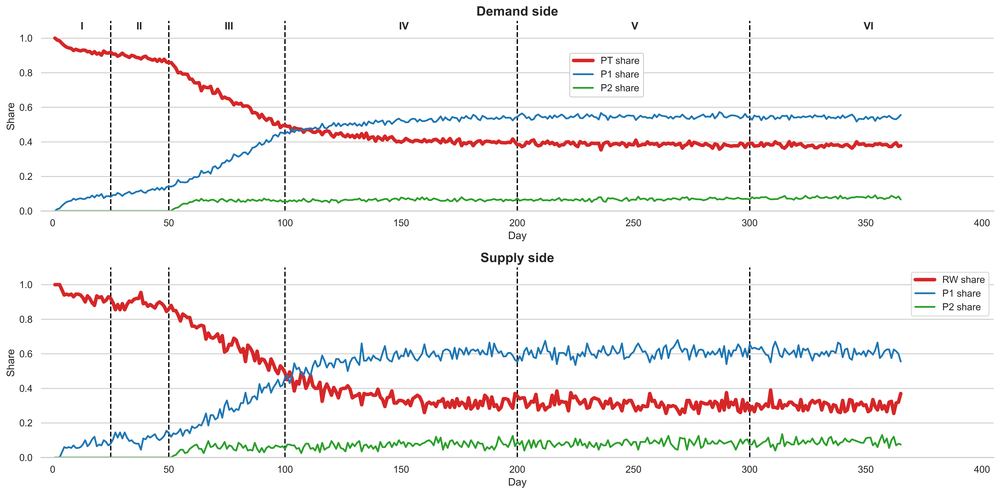

In [9]:
# with S-shaped curve nD=200 nP=2000 nV=200, with increased passenger sensitivity to changes in system
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,8))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)

for ax_n in [0,1]:
    
    x = []; ye = []; ym = []; yw = []; yms = []
    ypt= [] ; yp1=[]; yp2 = []
    if ax_n==0:
        for d in range(0,sim.params.nD):
            df = sim.res[d].pax_exp
            ypt.append(df.OUT.value_counts().get(True, 0)/params.nP)
            yp1.append(len(df[df.platform_id==1])/params.nP)
            yp2.append(len(df[df.platform_id==2])/params.nP)
        lx = [i for i in range(1,len(ypt)+1)]
        sns.lineplot(x=lx, y=ypt, label = 'PT share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp1, label = 'P1 share', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp2, label = 'P2 share', color='C2', lw=2, ax=ax[ax_n])#, marker='o')
            
    if ax_n==1:
        for d in range(0,sim.params.nD):
            df = sim.res[d].veh_exp
            ypt.append(df.OUT.value_counts().get(True, 0)/params.nV)
            yp1.append(len(df[df.platform_id==1])/params.nV)
            yp2.append(len(df[df.platform_id==2])/params.nV)
        lx = [i for i in range(1,len(ypt)+1)]
        sns.lineplot(x=lx, y=ypt, label = 'RW share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp1, label = 'P1 share', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp2, label = 'P2 share', color='C2', lw=2, ax=ax[ax_n])#, marker='o')

    
   
    ax[ax_n].vlines([25, 50, 100, 200, 300], 0, 1.1, linestyles='dashed', colors='black')
    ax[ax_n].grid(axis='x')
    ax[ax_n].set(xlabel='Day', ylabel='Share', ylim=(0,1.1),  xlim=(-5,405))
    
ax[0].set_title('Demand side',fontweight='bold', loc='center',fontsize=15);ax[1].set_title('Supply side',fontweight='bold', loc='center',fontsize=15)
ax[0].legend(frameon=True,framealpha=1, loc=(0.555,0.6))#,  bbox_to_anchor=(0.75, 1.24), ncol=4)
# ax[1].get_legend().set_visible(False)
for i in range(0,6):
    value = ['I','II','III','IV','V','VI']
    coords = [(12,1.05),(36,1.05),(74,1.05),(149,1.05),(249,1.05),(349,1.05)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')

# plt.yticks([0,1])

plt.tight_layout()
# plt.savefig('Fig1.png')

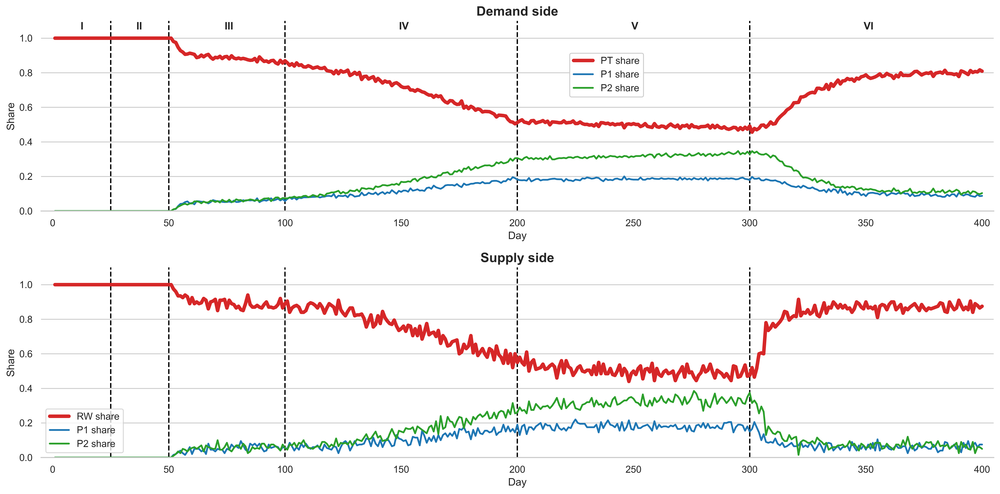

In [8]:
# with S-shaped curve nD=200 nP=2000 nV=200, with increased passenger sensitivity to changes in system
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,8))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)

for ax_n in [0,1]:
    
    x = []; ye = []; ym = []; yw = []; yms = []
    ypt= [] ; yp1=[]; yp2 = []
    if ax_n==0:
        for d in range(0,sim.params.nD):
            df = sim.res[d].pax_exp
            ypt.append(df.OUT.value_counts().get(True, 0)/params.nP)
            yp1.append(len(df[df.platform_id==1])/params.nP)
            yp2.append(len(df[df.platform_id==2])/params.nP)
        lx = [i for i in range(1,len(ypt)+1)]
        sns.lineplot(x=lx, y=ypt, label = 'PT share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp1, label = 'P1 share', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp2, label = 'P2 share', color='C2', lw=2, ax=ax[ax_n])#, marker='o')
            
    if ax_n==1:
        for d in range(0,sim.params.nD):
            df = sim.res[d].veh_exp
            ypt.append(df.OUT.value_counts().get(True, 0)/params.nV)
            yp1.append(len(df[df.platform_id==1])/params.nV)
            yp2.append(len(df[df.platform_id==2])/params.nV)
        lx = [i for i in range(1,len(ypt)+1)]
        sns.lineplot(x=lx, y=ypt, label = 'RW share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp1, label = 'P1 share', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp2, label = 'P2 share', color='C2', lw=2, ax=ax[ax_n])#, marker='o')

    
   
    ax[ax_n].vlines([25, 50, 100, 200, 300], 0, 1.1, linestyles='dashed', colors='black')
    ax[ax_n].grid(axis='x')
    ax[ax_n].set(xlabel='Day', ylabel='Share', ylim=(0,1.1),  xlim=(-5,405))
    
ax[0].set_title('Demand side',fontweight='bold', loc='center',fontsize=15);ax[1].set_title('Supply side',fontweight='bold', loc='center',fontsize=15)
ax[0].legend(frameon=True,framealpha=1, loc=(0.555,0.6))#,  bbox_to_anchor=(0.75, 1.24), ncol=4)
# ax[1].get_legend().set_visible(False)
for i in range(0,6):
    value = ['I','II','III','IV','V','VI']
    coords = [(12,1.05),(36,1.05),(74,1.05),(149,1.05),(249,1.05),(349,1.05)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')

# plt.yticks([0,1])

plt.tight_layout()
# plt.savefig('Fig1.png')

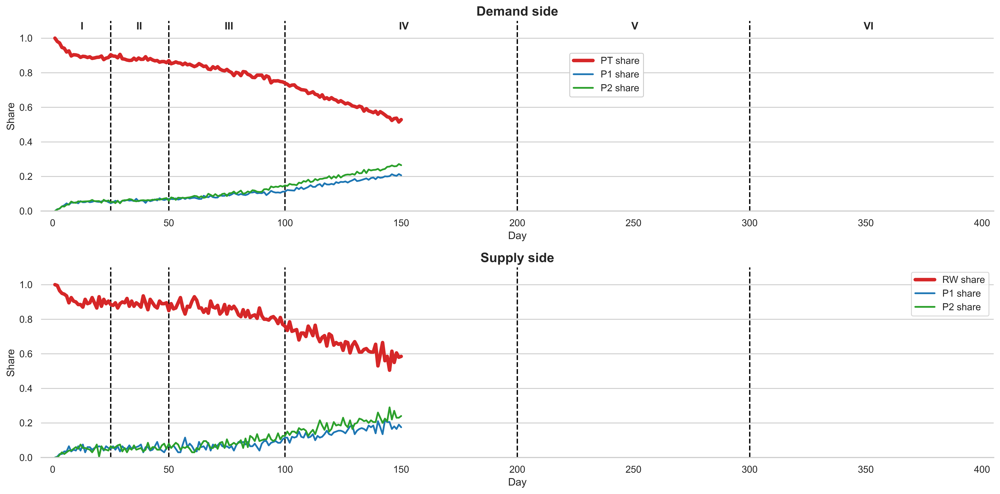

In [69]:
# with S-shaped curve nD=200 nP=2000 nV=200, with increased passenger sensitivity to changes in system
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,8))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)

for ax_n in [0,1]:
    
    x = []; ye = []; ym = []; yw = []; yms = []
    ypt= [] ; yp1=[]; yp2 = []
    if ax_n==0:
        for d in range(0,sim.params.nD):
            df = sim.res[d].pax_exp
            ypt.append(df.OUT.value_counts().get(True, 0)/params.nP)
            yp1.append(len(df[df.platform_id==1])/params.nP)
            yp2.append(len(df[df.platform_id==2])/params.nP)
        lx = [i for i in range(1,len(ypt)+1)]
        sns.lineplot(x=lx, y=ypt, label = 'PT share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp1, label = 'P1 share', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp2, label = 'P2 share', color='C2', lw=2, ax=ax[ax_n])#, marker='o')
            
    if ax_n==1:
        for d in range(0,sim.params.nD):
            df = sim.res[d].veh_exp
            ypt.append(df.OUT.value_counts().get(True, 0)/params.nV)
            yp1.append(len(df[df.platform_id==1])/params.nV)
            yp2.append(len(df[df.platform_id==2])/params.nV)
        lx = [i for i in range(1,len(ypt)+1)]
        sns.lineplot(x=lx, y=ypt, label = 'RW share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp1, label = 'P1 share', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp2, label = 'P2 share', color='C2', lw=2, ax=ax[ax_n])#, marker='o')

    
   
    ax[ax_n].vlines([25, 50, 100, 200, 300], 0, 1.1, linestyles='dashed', colors='black')
    ax[ax_n].grid(axis='x')
    ax[ax_n].set(xlabel='Day', ylabel='Share', ylim=(0,1.1),  xlim=(-5,405))
    
ax[0].set_title('Demand side',fontweight='bold', loc='center',fontsize=15);ax[1].set_title('Supply side',fontweight='bold', loc='center',fontsize=15)
ax[0].legend(frameon=True,framealpha=1, loc=(0.555,0.6))#,  bbox_to_anchor=(0.75, 1.24), ncol=4)
# ax[1].get_legend().set_visible(False)
for i in range(0,6):
    value = ['I','II','III','IV','V','VI']
    coords = [(12,1.05),(36,1.05),(74,1.05),(149,1.05),(249,1.05),(349,1.05)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')

# plt.yticks([0,1])

plt.tight_layout()
# plt.savefig('Fig1.png')

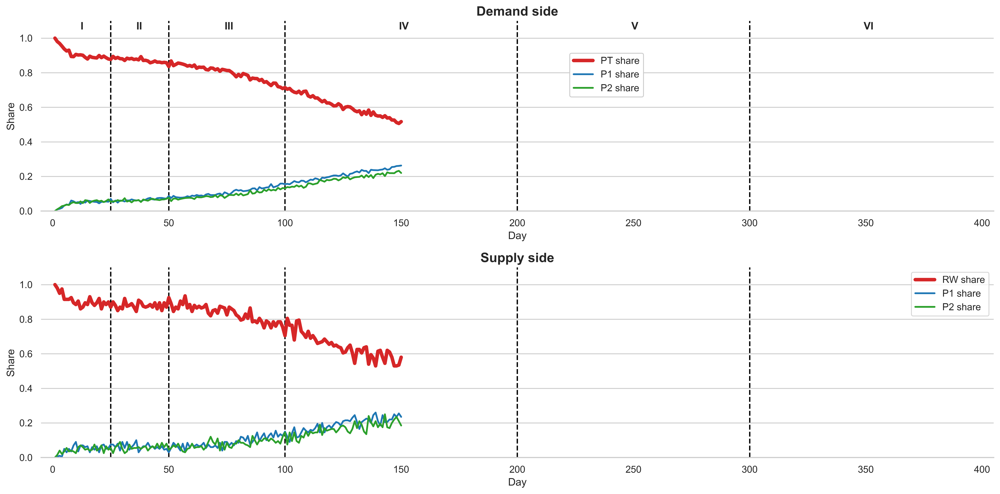

In [10]:
# with S-shaped curve nD=200 nP=2000 nV=200, with increased passenger sensitivity to changes in system
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,8))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)

for ax_n in [0,1]:
    
    x = []; ye = []; ym = []; yw = []; yms = []
    ypt= [] ; yp1=[]; yp2 = []
    if ax_n==0:
        for d in range(0,sim.params.nD):
            df = sim.res[d].pax_exp
            ypt.append(df.OUT.value_counts().get(True, 0)/params.nP)
            yp1.append(len(df[df.platform_id==1])/params.nP)
            yp2.append(len(df[df.platform_id==2])/params.nP)
        lx = [i for i in range(1,len(ypt)+1)]
        sns.lineplot(x=lx, y=ypt, label = 'PT share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp1, label = 'P1 share', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp2, label = 'P2 share', color='C2', lw=2, ax=ax[ax_n])#, marker='o')
            
    if ax_n==1:
        for d in range(0,sim.params.nD):
            df = sim.res[d].veh_exp
            ypt.append(df.OUT.value_counts().get(True, 0)/params.nV)
            yp1.append(len(df[df.platform_id==1])/params.nV)
            yp2.append(len(df[df.platform_id==2])/params.nV)
        lx = [i for i in range(1,len(ypt)+1)]
        sns.lineplot(x=lx, y=ypt, label = 'RW share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp1, label = 'P1 share', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp2, label = 'P2 share', color='C2', lw=2, ax=ax[ax_n])#, marker='o')

    
   
    ax[ax_n].vlines([25, 50, 100, 200, 300], 0, 1.1, linestyles='dashed', colors='black')
    ax[ax_n].grid(axis='x')
    ax[ax_n].set(xlabel='Day', ylabel='Share', ylim=(0,1.1),  xlim=(-5,405))
    
ax[0].set_title('Demand side',fontweight='bold', loc='center',fontsize=15);ax[1].set_title('Supply side',fontweight='bold', loc='center',fontsize=15)
ax[0].legend(frameon=True,framealpha=1, loc=(0.555,0.6))#,  bbox_to_anchor=(0.75, 1.24), ncol=4)
# ax[1].get_legend().set_visible(False)
for i in range(0,6):
    value = ['I','II','III','IV','V','VI']
    coords = [(12,1.05),(36,1.05),(74,1.05),(149,1.05),(249,1.05),(349,1.05)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')

# plt.yticks([0,1])

plt.tight_layout()
# plt.savefig('Fig1.png')

In [110]:
d = 50

sim.res[d].pax_exp.P1_EXPERIENCE_U.mean()

0.04032377814684501

In [111]:
sim.res[d].pax_exp.P2_EXPERIENCE_U.mean()

0.043524989224696754

In [63]:
0.3528443181999637*0.8 + 0.13496300285368446*0.18 + 0.4293304826834475*0.2

0.39243489161032374

In [64]:
alts_u = {'RW': 0.5, 'P1':0.27919638498158306,'P2':0.39243489161032374}
alts_x = {'RW':1, 'P1':0, 'P2':0}
alts_p = {'RW':1, 'P1':1, 'P2':1}
from numpy import log as ln

In [65]:
if len(alts_u) == 1: # there is only one choice RW
    print('True')  

if len(alts_u) == 2: # MNL
    for k in alts_p:
        if alts_p[k] == 1:
            alts_x[k] = math.exp(params.d2d.m*alts_u[k])
    for k in alts_p:
        if alts_p[k] == 1:
            alts_p[k] = alts_x[k]/sum(alts_x.values())

if len(alts_u) == 3: # Nested Logit (NL)
    sum_xm = math.exp(params.d2d.mn*alts_u['P1']) + math.exp(params.d2d.mn*alts_u['P2'])
    w = (1/params.d2d.mn)*ln(sum_xm)             # RH satisfaction - Logsum
    p1_pm = math.exp(params.d2d.mn*alts_u['P1'])/sum_xm
    p2_pm = math.exp(params.d2d.mn*alts_u['P2'])/sum_xm

    alts_p['RW'] = math.exp(params.d2d.m*alts_u['RW'])/(math.exp(params.d2d.m*alts_u['RW'])+math.exp(params.d2d.m*w))

    alts_p['P1'] = (math.exp(params.d2d.m*w)/(math.exp(params.d2d.m*alts_u['RW'])+math.exp(params.d2d.m*w)))*p1_pm
    alts_p['P2'] = (math.exp(params.d2d.m*w)/(math.exp(params.d2d.m*alts_u['RW'])+math.exp(params.d2d.m*w)))*p2_pm
    
alts_u

{'RW': 0.5, 'P1': 0.27919638498158306, 'P2': 0.39243489161032374}

In [66]:
alts_p

{'RW': 0.5982438030390169, 'P1': 0.09791650805325713, 'P2': 0.303839688907726}

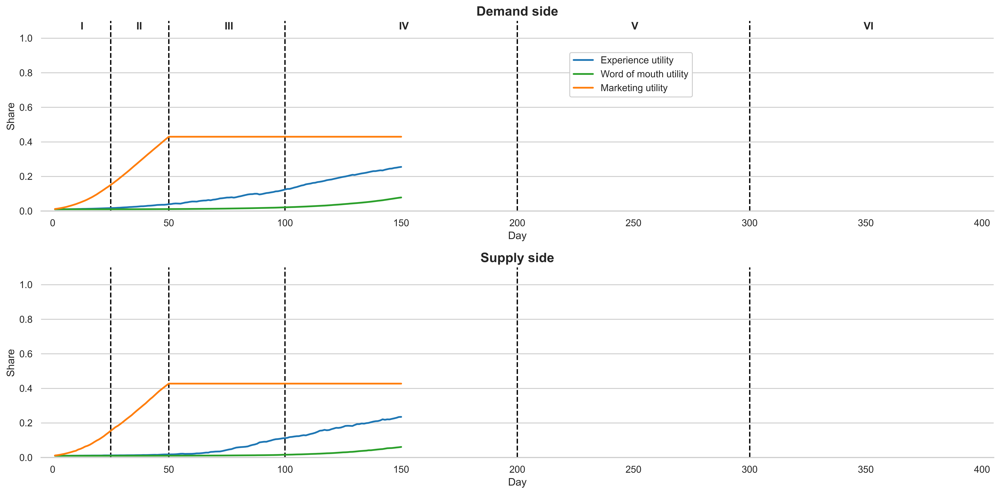

In [73]:
# baseline model for day to day evolution of single platform

sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,8))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)

for ax_n in [0,1]:
    
    x = []; ye = []; ym = []; yw = []; yms = []
    if ax_n==0:
        for d in range(0,sim.params.nD):
            yw.append(sim.res[d].pax_exp.P1_WOM_U.mean())
            ym.append(sim.res[d].pax_exp.P1_MARKETING_U.mean())
            ye.append(sim.res[d].pax_exp.P1_EXPERIENCE_U.mean())
            # yms.append(sim.res[d].pax_exp.OUT.value_counts().get(False, 0)/params.nP)
            
    if ax_n==1:
        for d in range(0,sim.params.nD):
            yw.append(sim.res[d].veh_exp.P1_WOM_U.mean())
            ym.append(sim.res[d].veh_exp.P1_MARKETING_U.mean())
            ye.append(sim.res[d].veh_exp.P1_EXPERIENCE_U.mean())
            # yms.append(sim.res[d].veh_exp.OUT.value_counts().get(False, 0)/params.nV)
    
    lx = [i for i in range(1,len(ye)+1)]
    # sns.lineplot(x=lx, y=yms, label = 'Market share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=ye, label = 'Experience utility', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=yw, label = 'Word of mouth utility', color='C2', lw=2, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=ym, label = 'Marketing utility', color='C1', lw=2, ax=ax[ax_n])#, marker='o')
   
    ax[ax_n].vlines([25, 50, 100, 200, 300], 0, 1.1, linestyles='dashed', colors='black')
    ax[ax_n].grid(axis='x')
    ax[ax_n].set(xlabel='Day', ylabel='Share', ylim=(0,1.1),  xlim=(-5,405))
    
ax[0].set_title('Demand side',fontweight='bold', loc='center',fontsize=15);ax[1].set_title('Supply side',fontweight='bold', loc='center',fontsize=15)
ax[0].legend(frameon=True,framealpha=1, loc=(0.555,0.6))#,  bbox_to_anchor=(0.75, 1.24), ncol=4)
ax[1].get_legend().set_visible(False)
for i in range(0,6):
    value = ['I','II','III','IV','V','VI']
    coords = [(12,1.05),(36,1.05),(74,1.05),(149,1.05),(249,1.05),(349,1.05)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')

# plt.yticks([0,1])

plt.tight_layout()
# plt.savefig('Fig1.png')

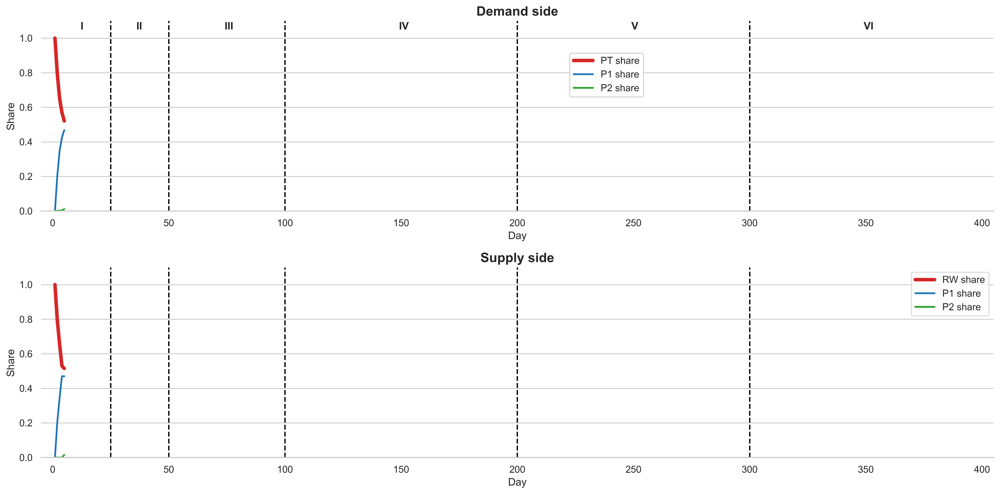

In [13]:
# with S-shaped curve nD=200 nP=2000 nV=200, with increased passenger sensitivity to changes in system
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,8))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)

for ax_n in [0,1]:
    
    x = []; ye = []; ym = []; yw = []; yms = []
    ypt= [] ; yp1=[]; yp2 = []
    if ax_n==0:
        for d in range(0,sim.params.nD):
            df = sim.res[d].pax_exp
            ypt.append(df.OUT.value_counts().get(True, 0)/params.nP)
            yp1.append(len(df[df.platform_id==1])/params.nP)
            yp2.append(len(df[df.platform_id==2])/params.nP)
        lx = [i for i in range(1,len(ypt)+1)]
        sns.lineplot(x=lx, y=ypt, label = 'PT share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp1, label = 'P1 share', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp2, label = 'P2 share', color='C2', lw=2, ax=ax[ax_n])#, marker='o')
            
    if ax_n==1:
        for d in range(0,sim.params.nD):
            df = sim.res[d].veh_exp
            ypt.append(df.OUT.value_counts().get(True, 0)/params.nV)
            yp1.append(len(df[df.platform_id==1])/params.nV)
            yp2.append(len(df[df.platform_id==2])/params.nV)
        lx = [i for i in range(1,len(ypt)+1)]
        sns.lineplot(x=lx, y=ypt, label = 'RW share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp1, label = 'P1 share', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
        sns.lineplot(x=lx, y=yp2, label = 'P2 share', color='C2', lw=2, ax=ax[ax_n])#, marker='o')

    
   
    ax[ax_n].vlines([25, 50, 100, 200, 300], 0, 1.1, linestyles='dashed', colors='black')
    ax[ax_n].grid(axis='x')
    ax[ax_n].set(xlabel='Day', ylabel='Share', ylim=(0,1.1),  xlim=(-5,405))
    
ax[0].set_title('Demand side',fontweight='bold', loc='center',fontsize=15);ax[1].set_title('Supply side',fontweight='bold', loc='center',fontsize=15)
ax[0].legend(frameon=True,framealpha=1, loc=(0.555,0.6))#,  bbox_to_anchor=(0.75, 1.24), ncol=4)
# ax[1].get_legend().set_visible(False)
for i in range(0,6):
    value = ['I','II','III','IV','V','VI']
    coords = [(12,1.05),(36,1.05),(74,1.05),(149,1.05),(249,1.05),(349,1.05)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')

# plt.yticks([0,1])

plt.tight_layout()
# plt.savefig('Fig1.png')

In [ ]:
=======================================================================================================================================================================

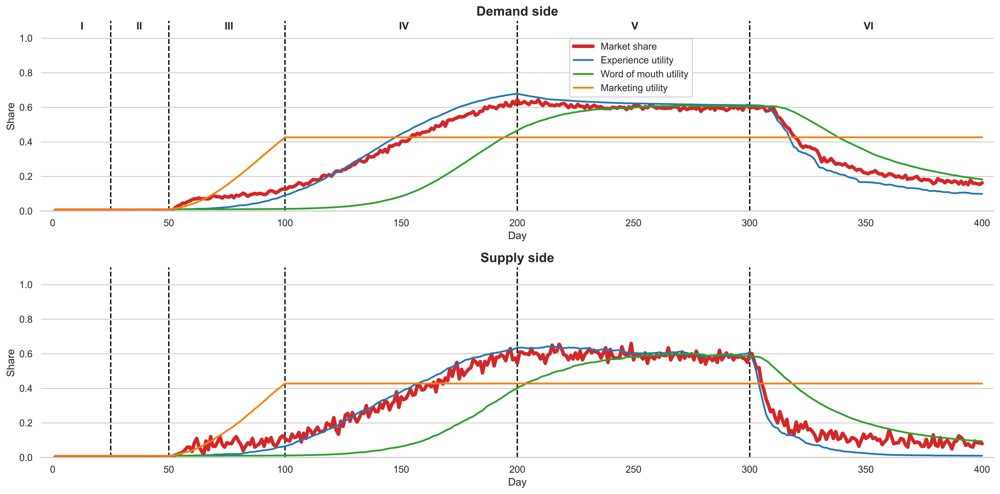

In [8]:
# baseline model for day to day evolution of single platform

sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')
fig, ax = plt.subplots(nrows=2, figsize=(16,8))
# plt.subplots_adjust(wspace=0.3, hspace=0.4)
sns.despine(left=True)

for ax_n in [0,1]:
    
    x = []; ye = []; ym = []; yw = []; yms = []
    if ax_n==0:
        for d in range(0,sim.params.nD):
            yw.append(sim.res[d].pax_exp.WOM_U.mean())
            ym.append(sim.res[d].pax_exp.MARKETING_U.mean())
            ye.append(sim.res[d].pax_exp.EXPERIENCE_U.mean())
            yms.append(sim.res[d].pax_exp.OUT.value_counts().get(False, 0)/params.nP)
            
    if ax_n==1:
        for d in range(0,sim.params.nD):
            yw.append(sim.res[d].veh_exp.WOM_U.mean())
            ym.append(sim.res[d].veh_exp.MARKETING_U.mean())
            ye.append(sim.res[d].veh_exp.EXPERIENCE_U.mean())
            yms.append(sim.res[d].veh_exp.OUT.value_counts().get(False, 0)/params.nV)
    
    lx = [i for i in range(1,len(ye)+1)]
    sns.lineplot(x=lx, y=yms, label = 'Market share', color='C3', lw=4, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=ye, label = 'Experience utility', color='C0', lw=2, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=yw, label = 'Word of mouth utility', color='C2', lw=2, ax=ax[ax_n])#, marker='o')
    sns.lineplot(x=lx, y=ym, label = 'Marketing utility', color='C1', lw=2, ax=ax[ax_n])#, marker='o')
   
    ax[ax_n].vlines([25, 50, 100, 200, 300], 0, 1.1, linestyles='dashed', colors='black')
    ax[ax_n].grid(axis='x')
    ax[ax_n].set(xlabel='Day', ylabel='Share', ylim=(0,1.1),  xlim=(-5,405))
    
ax[0].set_title('Demand side',fontweight='bold', loc='center',fontsize=15);ax[1].set_title('Supply side',fontweight='bold', loc='center',fontsize=15)
ax[0].legend(frameon=True,framealpha=1, loc=(0.555,0.6))#,  bbox_to_anchor=(0.75, 1.24), ncol=4)
ax[1].get_legend().set_visible(False)
for i in range(0,6):
    value = ['I','II','III','IV','V','VI']
    coords = [(12,1.05),(36,1.05),(74,1.05),(149,1.05),(249,1.05),(349,1.05)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')

# plt.yticks([0,1])

plt.tight_layout()
# plt.savefig('Fig1.png')

In [14]:
x=1
sim.res[1].pax_exp['P{}_WOM_U'.format(x)].mean()
sim.res[1].pax_exp['P{}_WOM_U'.format(x)].mean()

0.010000000000000163

<AxesSubplot:>

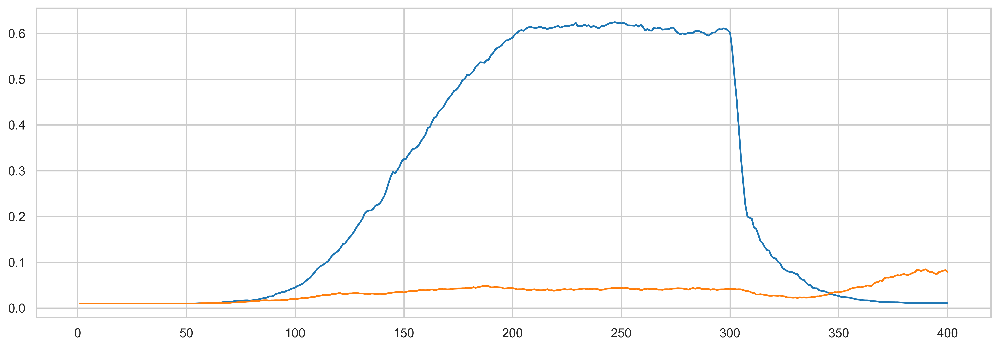

In [15]:
fig, ax = plt.subplots(figsize=(15,5))

ye_p1 = []
ye_p2 = []
x = 'veh'

for d in range(0,sim.params.nD):
    ye_p1.append(sim.res[d]['{}_exp'.format(x)].P1_EXPERIENCE_U.mean())
    ye_p2.append(sim.res[d]['{}_exp'.format(x)].P2_EXPERIENCE_U.mean())
    
    # ye_p1.append(sim.res[d]['{}_exp'.format(x)].P1_WOM_U.mean())
    # ye_p2.append(sim.res[d]['{}_exp'.format(x)].P2_WOM_U.mean())
    
    # ye_p1.append(sim.res[d]['{}_exp'.format(x)].P1_MARKETING_U.mean())
    # ye_p2.append(sim.res[d]['{}_exp'.format(x)].P2_MARKETING_U.mean())
        
x = [i for i in range(1,len(ye_p1)+1)]

sns.lineplot(x=x, y=ye_p1)
sns.lineplot(x=x, y=ye_p2)

In [22]:
def smooth(y,w=11,o=1,d=51):
    from scipy.signal import savgol_filter
    nans = [float('nan') for i in range(0,51)] 
    y = nans + list(savgol_filter(y[d:],w,o))
    for i in range(0,len(y)):
        if y[i]<0:
            y[i] = 0
    return y

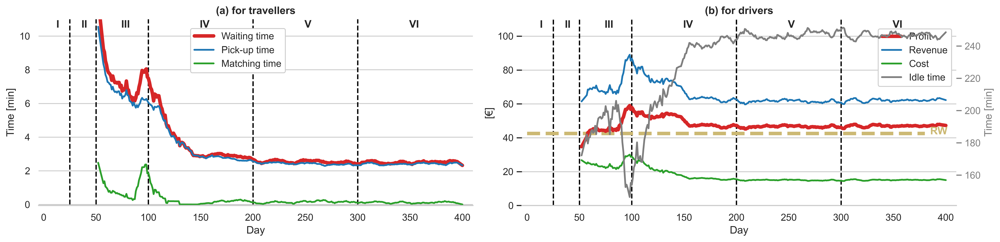

In [23]:
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')

fig, ax = plt.subplots(ncols=2, figsize=(16,4))
sns.despine(left=True)
    

x = []
yw = []
yp = []
yi = []
ym = []
yr = []
yprof = []
yc = []

for d in range(0,sim.params.nD):
    df = sim.res[d].pax_exp
    yw.append(df[df.OUT==False].ACTUAL_WT.mean()) # Waiting time per passenger
    ym.append(df[df.OUT==False].MATCHING_T.mean()) # Matching time per passenger
    # yprof.append(df.plat_profit.sum())
    
    df = sim.res[d].veh_exp
    yp.append(df[df.OUT==False].ARRIVES_AT_PICKUP.mean()/(df[df.OUT==False].nRIDES.mean()*60))
    yi.append(df[df.OUT==False].IDLE_TIME.mean()/60)
    yr.append(df[df.OUT==False].REVENUE.mean())
    yprof.append(df[df.OUT==False].ACTUAL_INC.mean())
    yc.append(df[df.OUT==False].COST.mean())



yw = smooth(yw)
ym = smooth(ym)
yp = smooth(yp)
yi = smooth(yi)
yr = smooth(yr)
yprof = smooth(yprof)
yc = smooth(yc)

x = [i for i in range(1,len(yp)+1)]
sns.lineplot(x=x, y=yw, label = 'Waiting time', color='C3',lw=4, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=yp, label = 'Pick-up time', color='C0',lw=2, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=ym, label = 'Matching time', color='C2',lw=2, ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=yprof, label = 'Profit', color='C3',lw=4, ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=yr, label = 'Revenue', color='C0',lw=2, ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=yc, label = 'Cost', color='C2',lw=2, ax=ax[1])#, marker='o')ax.twinx()
ax11 = ax[1].twinx()
sns.lineplot(x=x, y=yi, label = 'Idle time', color='C7',lw=2, ax=ax11)#, marker='o')
ax11.set(ylabel='Time [min]')
ax11.grid(b=None)

lines, labels = ax[1].get_legend_handles_labels()
lines2, labels2 = ax11.get_legend_handles_labels()
ax[1].legend(lines + lines2, labels + labels2,framealpha=1, loc=(0.82,0.64))
ax11.legend().remove()
# ax11.spines['right'].set_color('C7')
ax11.tick_params(axis='y', colors='C7')
ax11.yaxis.label.set_color('C7')

for i in [0,1]:
    ax[i].grid(axis='x')

ax[0].vlines([25, 50, 100, 200, 300], 0, 11, linestyles='dashed', colors='black')
ax[1].vlines([25, 50, 100, 200, 300], 0, 110, linestyles='dashed', colors='black')
ax[1].hlines([params.d2d.res_wage], 0, 380, linestyles='dashed', colors='y', lw=4)
ax[1].annotate('RW', xy =(385,42), fontweight='bold', color='y')

value = ['I','II','III','IV','V','VI']
for i in range(0,6):
    coords = [(12,10.5),(36,10.5),(74,10.5),(149,10.5),(249,10.5),(349,10.5)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')
for i in range(0,6):
    coords = [(12,105),(36,105),(74,105),(149,105),(249,105),(349,105)]
    ax[1].annotate(value[i], xy =coords[i], fontweight='bold')    
    
ax[0].set(xlabel='Day', ylabel='Time [min]', ylim=(-0.06,11), xlim=(-5,410)); ax[1].set(xlabel='Day', ylabel='[€]', ylim=(0,110),xlim=(-5,410))
ax[0].legend(loc=(0.35,0.713),framealpha=1)
sns.despine(left=True)

ax[0].set_title('(a) for travellers',fontweight='bold')
ax[1].set_title('(b) for drivers',fontweight='bold')

plt.tight_layout()
# plt.savefig('Fig3.png')

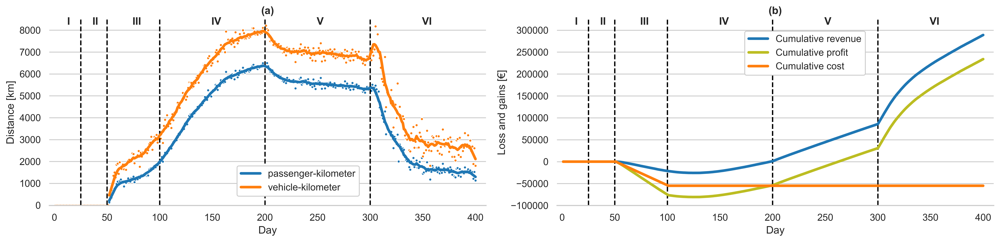

In [11]:
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')

fig, ax = plt.subplots(ncols=2,figsize=(16,4))
sns.despine(left=True)

x = []
ypkm = []
yvkm = []

for d in range(0,sim.params.nD):
    df = sim.res[d].veh_exp
    df['pkm'] = df.DRIVING_DIST-df.PICKUP_DIST
    ypkm.append(df.pkm.sum())
    yvkm.append(df.DRIVING_DIST.sum())

x = [i for i in range(1,len(ypkm)+1)]

ypkms = smooth(ypkm)
yvkms = smooth(yvkm)
sns.lineplot(x=x, y=ypkms, lw=3, label = 'passenger-kilometer', ax=ax[0])#, marker='o')
sns.lineplot(x=x, y=yvkms, lw=3, label = 'vehicle-kilometer', color='C1', ax=ax[0])#, marker='o')
lines, labels = ax[0].get_legend_handles_labels()

sns.scatterplot(x=x, y=ypkm, s=10,label = 'passenger-kilometer',ax=ax[0])#, marker='o')
sns.scatterplot(x=x, y=yvkm, s=10,label = 'vehicle-kilometer', color='C1',ax=ax[0])#, marker='o')

ax[0].set(ylim=(-10,8500), xlim=(-5,410), xlabel='Day', ylabel='Distance [km]')
ax[0].legend(lines, labels ,framealpha=1, loc=(0.43,0.05))
ax[0].grid(axis='x')
ax[0].vlines([25, 50, 100, 200, 300], 0, 8500, linestyles='dashed', colors='black')

value = ['I','II','III','IV','V','VI']
for i in range(0,6):
    coords = [(12,8250),(36,8250),(74,8250),(149,8250),(249,8250),(349,8250)]
    ax[0].annotate(value[i], xy =coords[i], fontweight='bold')
#-----------------------------------------------------------------------------------
x = []
ypr = []

for d in range(0,sim.params.nD):
    df = sim.res[d].pax_exp
    ypr.append(df[df.OUT==False].plat_profit.sum())
x = [i for i in range(1,len(ypr)+1)]

df = pd.Series(ypr).to_frame()
df.columns = ['income']
marketing_costs = 0.5
df['marketing costs']=df.apply(lambda x: -marketing_costs*2200 if x.name >50 and x.name<=100 else 0, axis = 1).astype(int)
df['profit']=df.income + df['marketing costs']

sns.lineplot(x=x, y=df.income.cumsum(), lw=3, label = 'Cumulative revenue', color='C0',ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=df.profit.cumsum(), lw=3, label = 'Cumulative profit', color='C8',ax=ax[1])#, marker='o')
sns.lineplot(x=x, y=df['marketing costs'].astype(int).cumsum(), lw=3, label = 'Cumulative cost', color='C1',ax=ax[1])#, marker='o')

ax[1].grid(axis='x')
ax[1].vlines([25, 50, 100, 200, 300], -100000, 325000, linestyles='dashed', colors='black')
# sns.lineplot(x=x, y=ypr, label = 'plat_profit')#, marker='o')
sns.despine(left=True)
ax[1].set(xlim=(-5,410), ylim=(-100000,325000), xlabel='Day', ylabel='Loss and gains [€]')
ax[1].legend(framealpha=1, loc=(0.43,0.7))

value = ['I','II','III','IV','V','VI']
for i in range(0,6):
    coords = [(12,312500),(36,312500),(74,312500),(149,312500),(249,312500),(349,312500)]
    ax[1].annotate(value[i], xy =coords[i], fontweight='bold')
    

ax[0].set_title('(a)',fontweight='bold')
ax[1].set_title('(b)',fontweight='bold')


plt.tight_layout()
plt.savefig('Fig4.png')

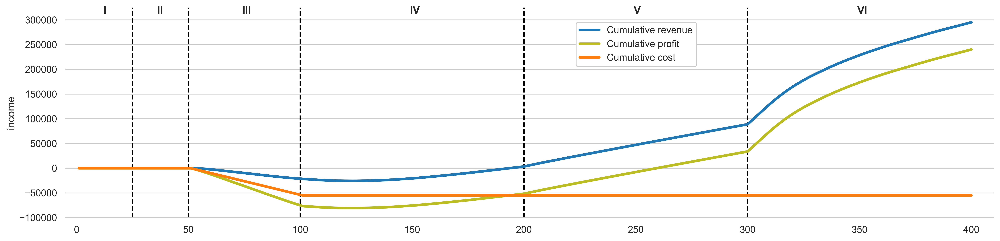

In [177]:
sns.set(rc={"figure.dpi":500, 'savefig.dpi':500})
sns.set(palette='tab10',font_scale=1)#, rc={'axes.facecolor':'lightblue', 'figure.facecolor':'lightgreen'},)
sns.set_style('whitegrid')

fig, ax = plt.subplots(figsize=(16,4))
sns.despine(left=True)

x = []
ypr = []

for d in range(0,sim.params.nD):
    df = sim.res[d].pax_exp
    ypr.append(df[df.OUT==False].plat_profit.sum())
x = [i for i in range(1,len(ypr)+1)]

df = pd.Series(ypr).to_frame()
df.columns = ['income']
marketing_costs = 0.5
df['marketing costs']=df.apply(lambda x: -marketing_costs*2200 if x.name >50 and x.name<=100 else 0, axis = 1).astype(int)
df['profit']=df.income + df['marketing costs']

sns.lineplot(x=x, y=df.income.cumsum(), lw=3, label = 'Cumulative revenue', color='C0')#, marker='o')
sns.lineplot(x=x, y=df.profit.cumsum(), lw=3, label = 'Cumulative profit', color='C8')#, marker='o')
sns.lineplot(x=x, y=df['marketing costs'].astype(int).cumsum(), lw=3, label = 'Cumulative cost', color='C1')#, marker='o')

ax.grid(axis='x')
ax.vlines([25, 50, 100, 200, 300], -100000, 325000, linestyles='dashed', colors='black')
# sns.lineplot(x=x, y=ypr, label = 'plat_profit')#, marker='o')
sns.despine(left=True)
ax.set(xlim=(-5,410), ylim=(-100000,325000))
ax.legend(framealpha=1, loc=(0.55,0.72))

value = ['I','II','III','IV','V','VI']
for i in range(0,6):
    coords = [(12,312500),(36,312500),(74,312500),(149,312500),(249,312500),(349,312500)]
    ax.annotate(value[i], xy =coords[i], fontweight='bold')

plt.tight_layout()
# plt.savefig('Fig5.png')

In [7]:
from numpy import log as ln

params.d2d.mn = 50
params.d2d.m = 5

alts_u = {'RW': 0.5, 'plats':{'P1': 'Nan', 'P2': 'Nan'}}
alts_x = {'RW': 'Nan', 'P1': 'Nan', 'P2': 'Nan', 'plats':{'P1': 'Nan', 'P2': 'Nan'}}
alts_p = {'RW': 'Nan', 'plats':{'P1': 'Nan', 'P2': 'Nan'}}

alts_u = {'RW': 0.5, 'plats':{'P1': 0.5, 'P2': 0}}

for p in alts_u['plats']: # calculate X in platform nest
    alts_x['plats'][p] = math.exp(params.d2d.mn*alts_u['plats'][p]) if alts_u['plats'][p]!= 'Nan' else 0

w = (1/params.d2d.mn)*ln(sum(alts_x['plats'].values()))    # RH satisfaction - Logsum
for p in alts_u['plats']: # calculate probability in platform nest
    alts_p['plats'][p] = alts_x['plats'][p]/sum(alts_x['plats'].values())
    alts_u[p] = w if alts_u['plats'][p]!= 'Nan' else 'Nan'
    
alts_x.pop('plats', None)
for alt in alts_x:
    alts_x[alt] = math.exp(params.d2d.m*alts_u[alt]) if alts_u[alt]!= 'Nan' else 0

x_w = math.exp(params.d2d.m*w)
for alt in alts_x:
    alts_p[alt] = (alts_x[alt]/(alts_x['RW'] + x_w))*alts_p['plats'][alt] if alt!='RW' else alts_x[alt]/(alts_x['RW'] + x_w)

print(alts_u)
alts_p

{'RW': 0.5, 'plats': {'P1': 0.5, 'P2': 0}, 'P1': 0.5000000000002778, 'P2': 0.5000000000002778}


{'RW': 0.4999999999996527,
 'plats': {'P1': 0.9999999999861121, 'P2': 1.3887943864771144e-11},
 'P1': 0.49999999999340333,
 'P2': 6.943971932390395e-12}